In [23]:
import numpy as np
import pandas as pd
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

In [24]:
x = pd.read_csv('x.txt', sep=";")
y = pd.read_csv('y.txt', sep=";")

y1 = y.drop(["Row"], axis=1)
x = pd.concat([x, y1], axis=1, sort=False)

In [25]:
x.head()

,Row,Year,IsDayBin,Month,WindSpeed,IrrDirect,IrrDiffuse,Temperature,Percipitation,SnowFlow,SnowMass,AirDensity,RadSurface,RadTop,CloudCover,WindPower,PVPower
0,R1,2016,Night,1,5.777,0.0,0.0,-1.210,0.114,0.099,10.592,1.268,0.0,0.0,1.0,396.352,0.0
1,R2,2016,Night,1,5.887,0.0,0.0,-0.862,0.114,0.103,10.671,1.266,0.0,0.0,1.0,417.778,0.0
2,R3,2016,Night,1,5.957,0.0,0.0,-0.552,0.122,0.111,10.756,1.265,0.0,0.0,1.0,434.581,0.0
3,R4,2016,Night,1,6.025,0.0,0.0,-0.297,0.158,0.145,10.855,1.264,0.0,0.0,1.0,448.482,0.0
4,R5,2016,Night,1,6.101,0.0,0.0,-0.149,0.164,0.081,10.884,1.263,0.0,0.0,1.0,465.790,0.0


In [26]:
# Binarize day/night and drop redundant columns
X = pd.get_dummies(x, columns=["IsDayBin"])
X = X.drop(["Year", "IsDayBin_Night", "PVPower"], axis=1)

In [27]:
X.head()

,Row,Month,WindSpeed,IrrDirect,IrrDiffuse,Temperature,Percipitation,SnowFlow,SnowMass,AirDensity,RadSurface,RadTop,CloudCover,WindPower,IsDayBin_Day
0,R1,1,5.777,0.0,0.0,-1.210,0.114,0.099,10.592,1.268,0.0,0.0,1.0,396.352,0
1,R2,1,5.887,0.0,0.0,-0.862,0.114,0.103,10.671,1.266,0.0,0.0,1.0,417.778,0
2,R3,1,5.957,0.0,0.0,-0.552,0.122,0.111,10.756,1.265,0.0,0.0,1.0,434.581,0
3,R4,1,6.025,0.0,0.0,-0.297,0.158,0.145,10.855,1.264,0.0,0.0,1.0,448.482,0
4,R5,1,6.101,0.0,0.0,-0.149,0.164,0.081,10.884,1.263,0.0,0.0,1.0,465.790,0


In [28]:
# Numpify
X = X.values

In [29]:
X_n = (X[:,1:] - X[:,1:].min()) / (X[:,1:].max() - X[:,1:].min())

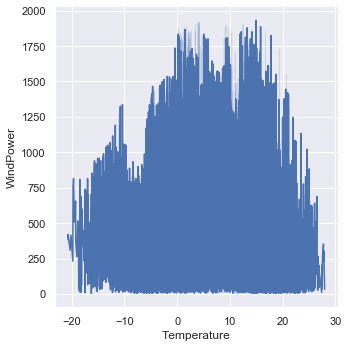

In [32]:
#f, ax = plt.subplots(figsize=(10, 10))
sns.relplot(x="Temperature", y="WindPower", kind="line", data=x)
plt.show()

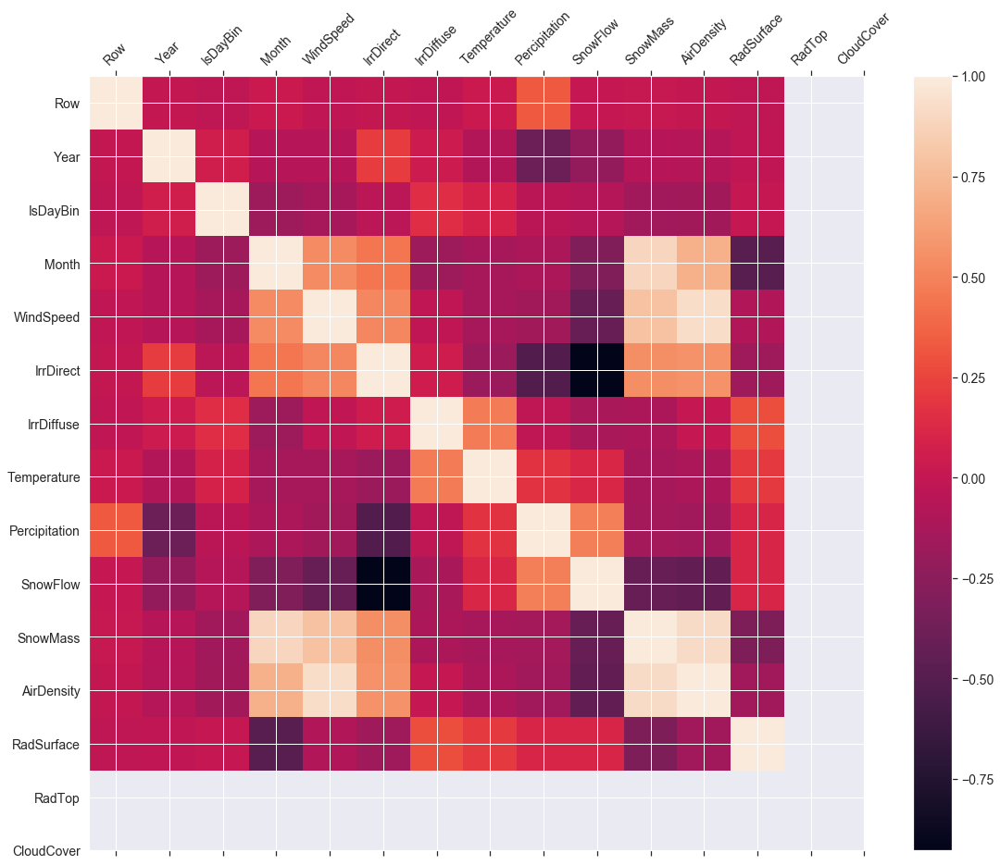

In [143]:
f = plt.figure(figsize=(19, 15))
plt.matshow(x.corr(), fignum=f.number)
plt.xticks(range(x.shape[1]), x.columns, fontsize=14, rotation=45)
plt.yticks(range(x.shape[1]), x.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

In [148]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.5,random_state=42)

In [149]:
X_h, X_w = X_train.shape
Y_h, Y_w = Y_train.shape

def variance(d):
    n = np.size(d)
    mean = np.sum(d) / n
    err = d - mean
    return np.sum(err**2) / n

def ls(d):
    n = np.size(d)
    x_vals = np.arange(0, n)
    y_mean = np.sum(d) / n
    x_mean = np.sum(x_vals) / n
    x_err = x_vals - x_mean
    B1 = np.sum((x_err * d)) / np.sum(x_err**2)
    B0 = y_mean - B1 * x_mean
    return B0 + B1 * x_vals


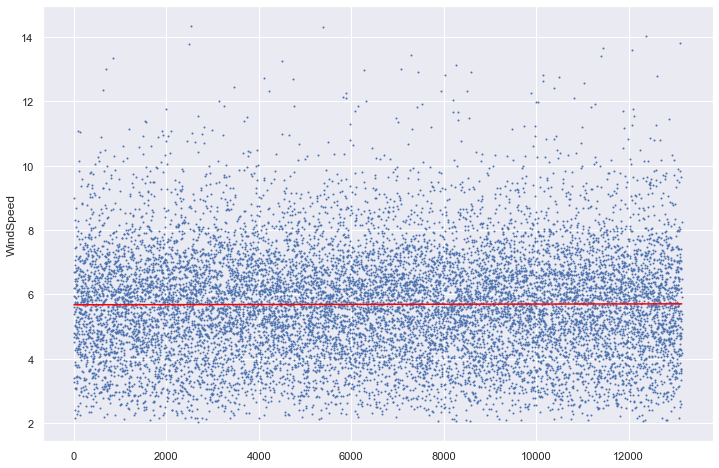

In [150]:
y1 = ls(X_train[:,2])
x1 = np.arange(0, np.size(y1))

plt.figure(figsize=(12,8))
plt.plot(x1, y1, color="red")
plt.scatter(x1, X_train[:, 2], s=1)
plt.ylabel("WindSpeed")
plt.show()

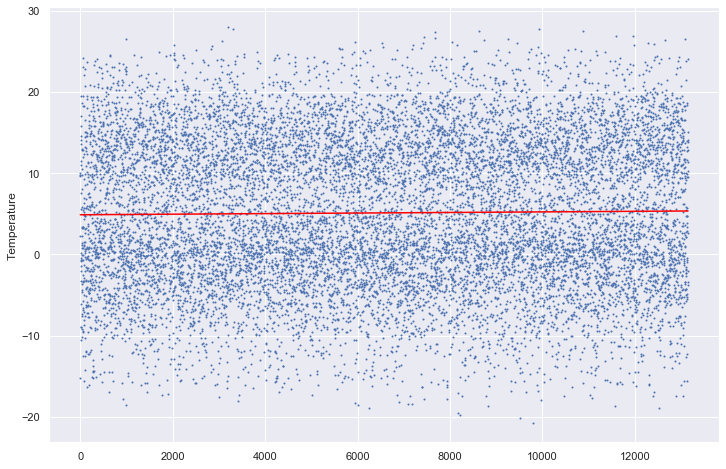

In [151]:
y1 = ls(X_train[:,5])
x1 = np.arange(0, np.size(y1))

plt.figure(figsize=(12,8))
plt.plot(x1, y1, color="red")
plt.scatter(x1, X_train[:, 5], s=1)
plt.ylabel('Temperature')
plt.show()

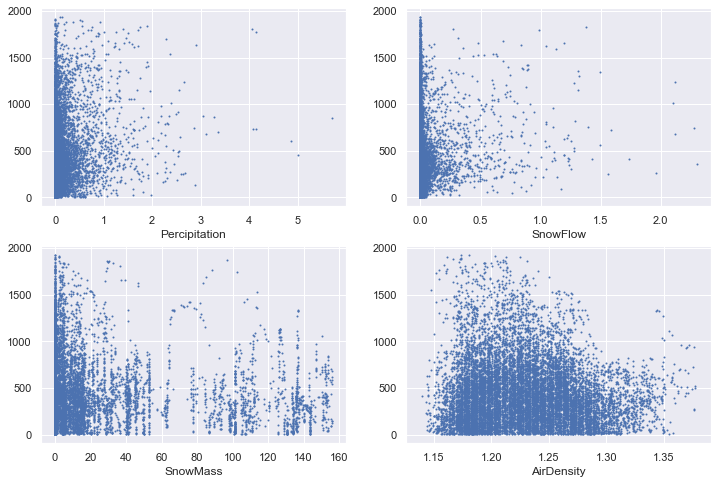

In [152]:
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.scatter(X_train[:, 6], Y_train[:,1], s=1)
plt.ylabel('')
plt.xlabel('Percipitation')

plt.subplot(2,2,2)
plt.scatter(X_train[:, 7], Y_train[:,1], s=1)
plt.xlabel('SnowFlow')

plt.subplot(2,2,3)
plt.scatter(X_train[:, 8], Y_train[:,1], s=1)
plt.xlabel('SnowMass')

plt.subplot(2,2,4)
plt.scatter(X_train[:, 9], Y_train[:,1], s=1)
plt.xlabel('AirDensity')

plt.show()